In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
from describe import dslr

In [25]:
def scatter_plot(df):
    numeric_df = df.select_dtypes(include='number')
    numeric_df = numeric_df.drop(['Index'], axis=1)
    numeric_df_with_house = numeric_df.join(df['Hogwarts House'])

    features = numeric_df.columns
    feature_pairs = [(features[i], features[j]) for i in range(len(features)) for j in range(i+1, len(features))]

    num_plots = len(feature_pairs)
    num_columns = 3  
    num_rows = num_plots // num_columns + (1 if num_plots % num_columns else 0)

    fig, axs = plt.subplots(num_rows, num_columns, figsize=(15, num_rows * 5))
    axs = axs.flatten()

    for i, (feature1, feature2) in enumerate(feature_pairs):
        sns.scatterplot(data=numeric_df_with_house, x=feature1, y=feature2, hue='Hogwarts House', ax=axs[i])
        correlation = numeric_df[[feature1, feature2]].corr().iloc[0, 1]
        axs[i].set_title(f'{feature1} vs {feature2}\nCorrelation: {correlation:.2f}')
        axs[i].set_xlabel(feature1)
        axs[i].set_ylabel(feature2)
        axs[i].legend()

    for j in range(i + 1, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

In [7]:
test = dslr("datasets/dataset_train.csv")

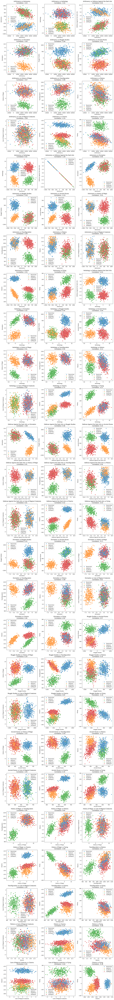

In [26]:
scatter_plot(test.df)